## Fish Eye Calibration

We will perform fisheye calibration using opencv's fisheye calibration function, and generate a rectified image (i.e. where the barrel distortion in the image has been removed. An example of fisheye distortion correction is shown below:

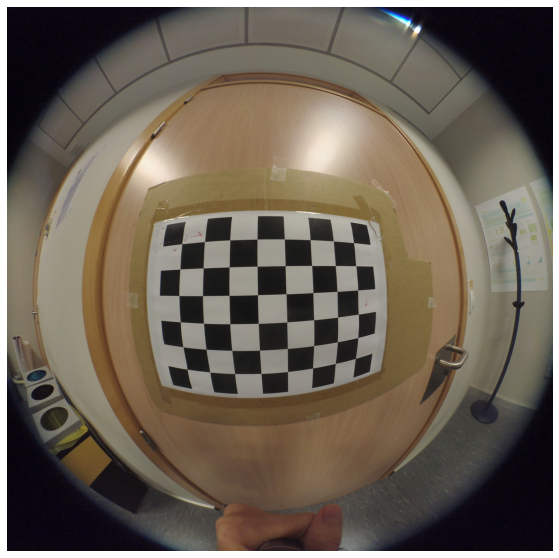
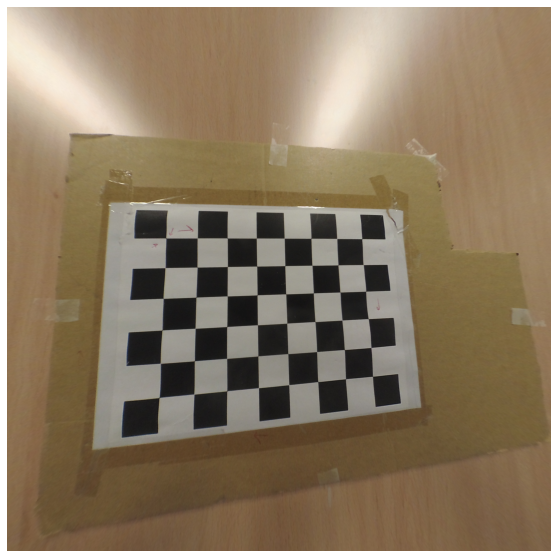


A folder of 26 fisheye calibration images is provided. 
For this particular dataset, the checkerboard pattern used is an 8*6 target, and the square size is 25mm

In addition to performing the calibration, you will also be required to calculate and visualize the reprojection error. The reprojection error is the distance between a pattern keypoint detected in a calibration image, and a corresponding world point projected into the same image. 

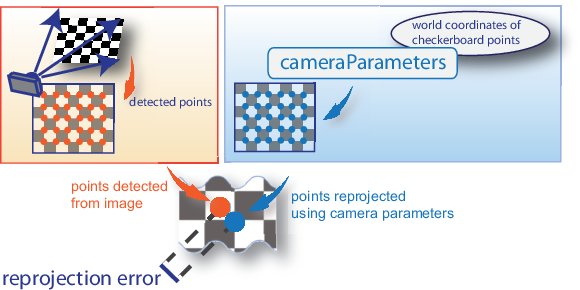

Finally, you will be asked to debug and improve the mean reprojection error, and suggest further improvements to improve calibration accuracy




## Libraries required for this assignment

In [58]:
%matplotlib inline
# import required libraries
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

## Define calibration parameters
- Define checkerboard shape (rows and columns, defined by the inner corners of the target)
- define the target square size (25mm)
- define the subpix_criteria (note: check online documentation)
- define calibration_flags (again, check online documentation). Hint, don't set the "CALIB_CHECK_COND" flag
- define object points and image point variables

In [59]:
# Define the chess board rows and columns
CHECKERBOARD = (8,6)
SQUARE_SIZE = 25  # square size in mm
subpix_criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.1)
#calibration_flags = cv2.fisheye.CALIB_RECOMPUTE_EXTRINSIC + cv2.fisheye.CALIB_CHECK_COND + cv2.fisheye.CALIB_FIX_SKEW
calibration_flags = cv2.fisheye.CALIB_RECOMPUTE_EXTRINSIC + cv2.fisheye.CALIB_FIX_SKEW
objp = np.zeros((1, CHECKERBOARD[0]*CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)*SQUARE_SIZE

objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

# define number of images to be used
N_img = 26

## Perform the calibration

Note: there are plenty of online tutorials on this process, feel free to use as a reference. Just be aware that in this example, we will be using the cv2.fisheye.calibrate function - not all tutorials use this function

- Read in all of the calibration images using cv2.imread. Hint: create a list of images
- Convert images to greyscale
- Find the chessboard corners
- Use the cv2.fisheye.calibrate function to calibrate the camera

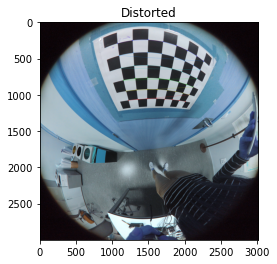

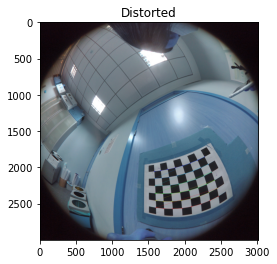

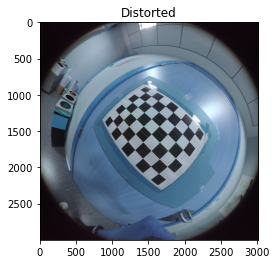

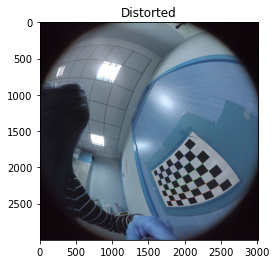

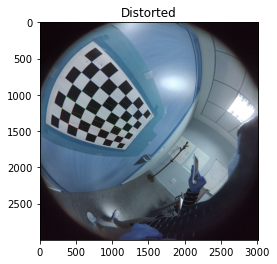

...

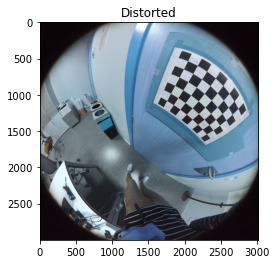

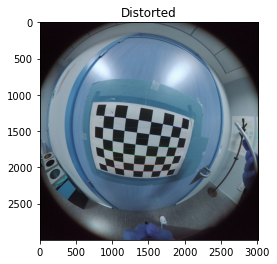

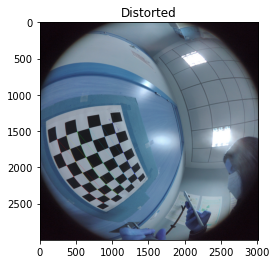

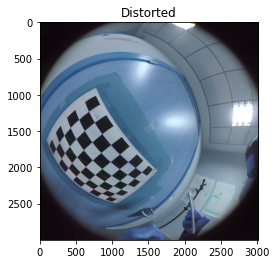

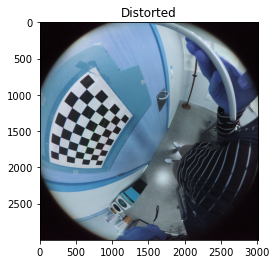

In [60]:
calib_images = glob.glob('images_fisheye/*.jpg')

for image_file in calib_images:
    
    img = cv2.imread(image_file)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

   
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)
   
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))
        imgpoints.append(corners2)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
        plt.title("Distorted")
        plt.imshow(img)
        plt.show()
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

In [71]:
ret, K, D, rvecs, tvecs = cv2.fisheye.calibrate(objpoints, imgpoints, gray.shape[::-1], None, None)

print("K:", K)
print("D:", D)

K: [[7.44515352e+02 4.48857781e+00 1.49882437e+03]
 [0.00000000e+00 7.50343859e+02 1.49324058e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
D: [[-0.23837743]
 [ 0.23737016]
 [ 0.45132655]
 [-0.24417944]]


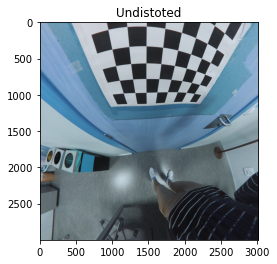

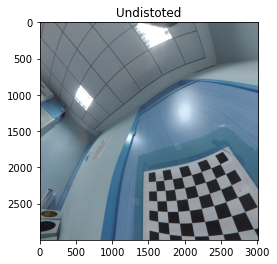

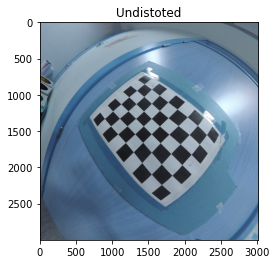

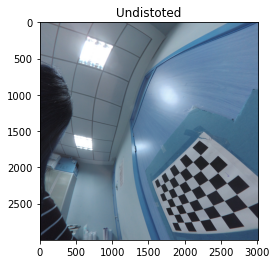

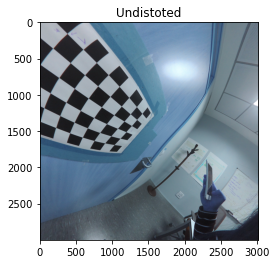

...

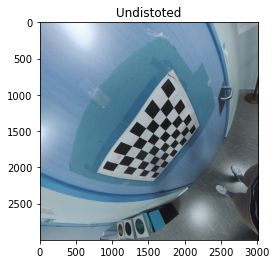

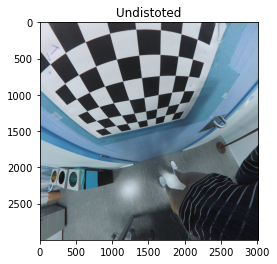

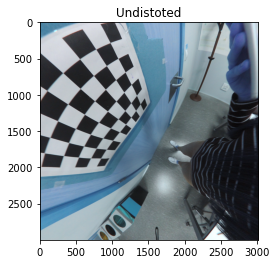

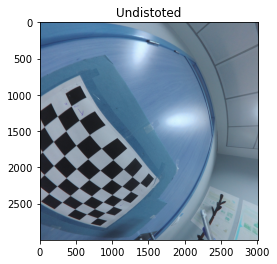

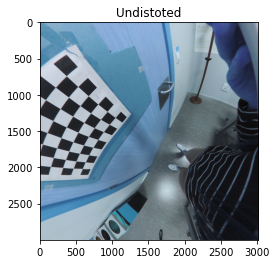

In [72]:
import matplotlib.pyplot as plt

map1, map2 = cv2.fisheye.initUndistortRectifyMap(K, D, np.eye(3), K, gray.shape[::-1], cv2.CV_16SC2)
for image_file in calib_images:
    
    img = cv2.imread(image_file)

    
    img_rect = cv2.remap(img, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
   
    
    plt.title("Undistorted")
    plt.imshow(img_rect)
    plt.show()

cv2.destroyAllWindows()

## Calculate reprojection error
Write a function that calculates the reprojection error
- the function should return both individual projection errors for each image and the average reprojection error for all images
- include a "debug" flag. If debug==True, then plot both the detected points and reprojected points for each image. This is a good way to visualize the accuracy of calibration. The result should look like the image below.

Review both the individual and mean projection errors for your results. It should become apprarant that in some of the images, calibration was not successful...

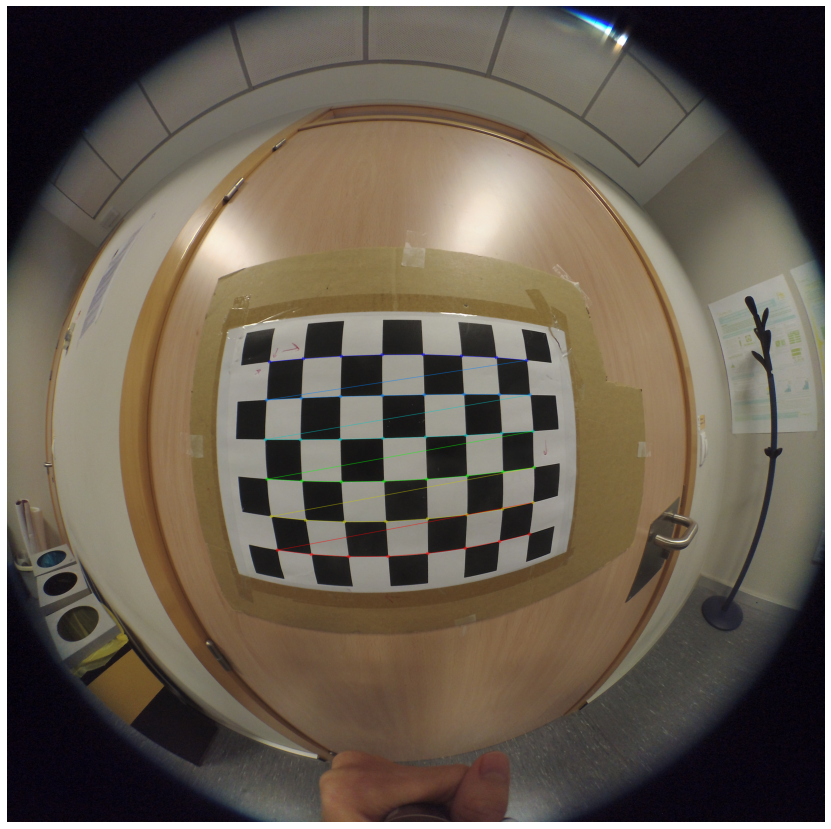

In [73]:
def calculate_reprojection_error(objpoints, imgpoints, K, D, rvecs, tvecs):
    mean_error = 0
    errors=0

    
    for i in range(len(objpoints)):
        imgpoints2, _ = cv2.fisheye.projectPoints(objpoints[i], rvecs[i], tvecs[i], K, D)
    
        error = cv2.norm(imgpoints[i], imgpoints2.reshape(imgpoints[i].shape), cv2.NORM_L2)/len(imgpoints2)
        mean_error += error
    errors = mean_error/len(objpoints)   
    return errors, mean_error


In [75]:
Error , Mean = calculate_reprojection_error(objpoints, imgpoints, K, D, rvecs, tvecs)

print("Mean reprojection error: ", Error)
print("Total reprojection error: ", Mean)


Mean reprojection error:  940.7383271702944
Total reprojection error:  63970.20624758002


## Debug performance
By now, you should have been able to identify a number of images where calibration didn't work:
- suggest possible reasons why calibration didn't work on these images
- Exclude these images from the calibration procedure, and assess the impact on reprojection error


# The claibration might not work for all images because of various reasons. Some possible reasons might be:

Incorrect checkerboard detection: If the algorithm is not able to accurately detect the corners of the checkerboard pattern, the calibration will be inaccurate.


Inaccurate checkerboard pattern: If the checkerboard pattern used for calibration is not accurate, for example if the squares are not perfectly square or the corners are not perfectly straight, it can lead to errors in calibration.

Inconsistent data: If the images used for calibration have different lighting conditions, angles, or other variations, it can lead to inconsistencies in the calibration results.

Insufficient image quality: Poor lighting, blurry images, or low contrast can make it difficult for the algorithm to detect the checkerboard pattern, leading to inaccurate calibration.

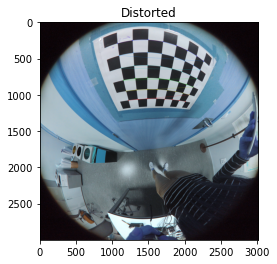

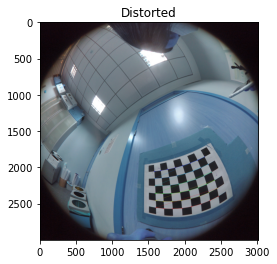

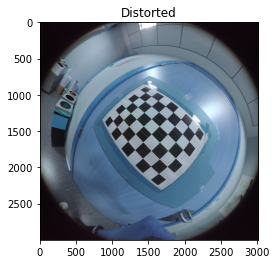

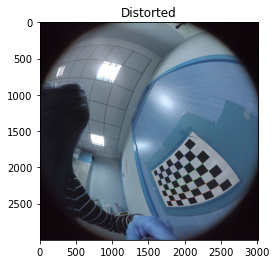

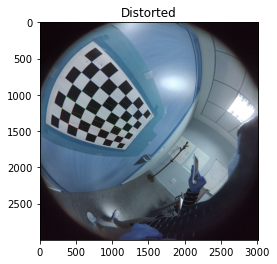

...

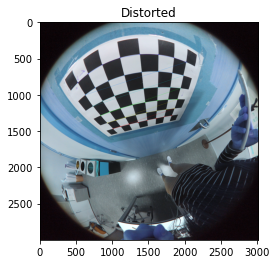

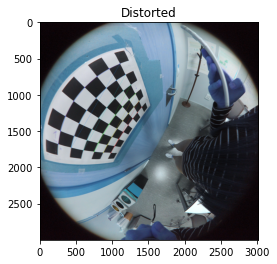

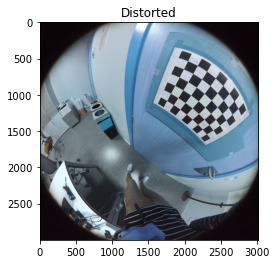

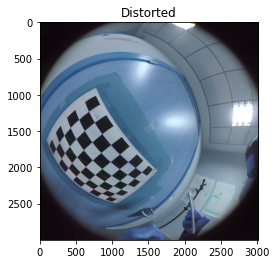

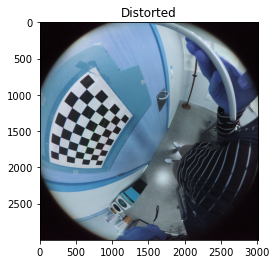

In [90]:
calib_images = glob.glob('sub_fisheye/*.jpg')

for image_file in calib_images:
   
    img = cv2.imread(image_file)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, None)
    
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))
        imgpoints.append(corners2)

        
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
        plt.title("Distorted")
        plt.imshow(img)
        plt.show()
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

In [91]:
ret, K, D, rvecs, tvecs = cv2.fisheye.calibrate(objpoints, imgpoints, gray.shape[::-1], None, None)

print("K:", K)
print("D:", D)

K: [[7.39122026e+02 4.72662854e+00 1.50017526e+03]
 [0.00000000e+00 7.43710270e+02 1.49204882e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
D: [[-0.45558069]
 [ 1.15329922]
 [-0.3435866 ]
 [-0.0733049 ]]


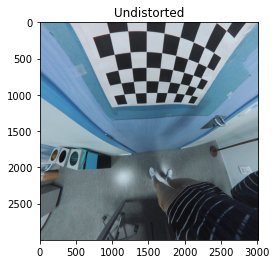

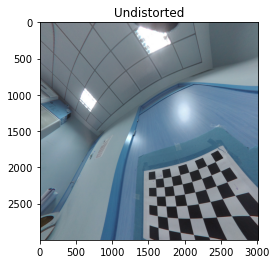

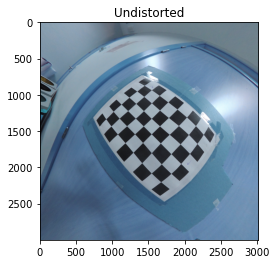

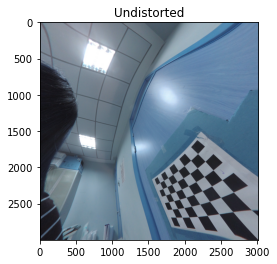

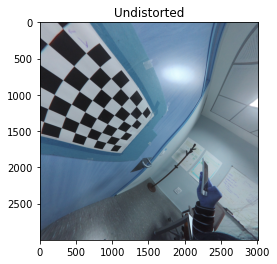

...

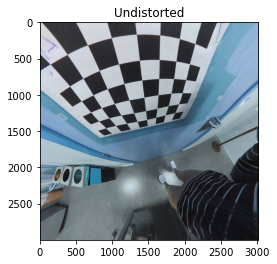

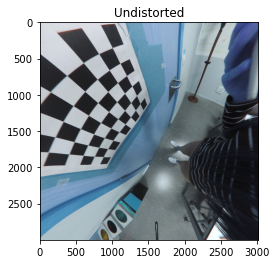

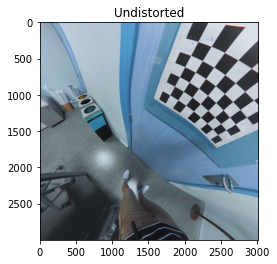

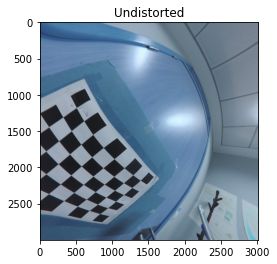

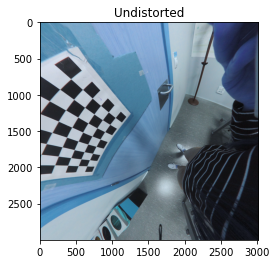

In [92]:
map1, map2 = cv2.fisheye.initUndistortRectifyMap(K, D, np.eye(3), K, gray.shape[::-1], cv2.CV_16SC2)
for image_file in calib_images:
    
    img = cv2.imread(image_file)

    
    img_rect = cv2.remap(img, map1, map2, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)    
    
    plt.title("Undistorted")
    plt.imshow(img_rect)
    plt.show()

cv2.destroyAllWindows()

In [93]:
def calculate_reprojection_error(objpoints, imgpoints, K, D, rvecs, tvecs):
    mean_error = 0
    errors=0

    
    for i in range(len(objpoints)):
        imgpoints2, _ = cv2.fisheye.projectPoints(objpoints[i], rvecs[i], tvecs[i], K, D)
    
        error = cv2.norm(imgpoints[i], imgpoints2.reshape(imgpoints[i].shape), cv2.NORM_L2)/len(imgpoints2)
        mean_error += error
        errors = mean_error/len(objpoints)
    return errors, mean_error


In [94]:
Error , Mean = calculate_reprojection_error(objpoints, imgpoints, K, D, rvecs, tvecs)

print("Mean reprojection error: ", Error)
print("Total reprojection error: ", Mean)

Mean reprojection error:  767.4941560552647
Total reprojection error:  89796.81625846597
